In [2]:
%reload_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go
import requests
import json
from scipy.stats import pearsonr
import geopandas as gpd
import zipfile

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
getUrl='http://api.openweathermap.org/data/2.5/air_pollution/history?lat=6.53&lon=3.58&start=1672531200&end=1701388799&appid=e0cf8f04baf5695b8192801a6208bc17'
response = requests.request("GET", getUrl, params={"appid": "e0cf8f04baf5695b8192801a6208bc17"})
#return(json.loads(response.content.decode('utf-8')))


In [ ]:
response
data = json.loads(response.content.decode('utf-8'))
data

{'cod': 401,
 'message': 'Invalid API key. Please see https://openweathermap.org/faq#error401 for more info.'}

In [ ]:
nigeria_lat_long = pd.read_csv('/content/drive/MyDrive/nigeria_geo_cood.csv')
nigeria_lat_long.head()

,Name,Country,Latitude,Longitude,Other Language Names
0,Abia,Nigeria,5.454095,7.515307,"""ref""=>""AB"", ""name""=>""Abia"", ""name:hu""=>""Abia""..."
1,Adamawa,Nigeria,9.512977,12.388189,"""ref""=>""AD"", ""name""=>""Adamawa"", ""name:ar""=>""آد..."
2,Akwa Ibom,Nigeria,4.940864,7.841227,"""ref""=>""AK"", ""name""=>""Akwa Ibom"", ""name:ar""=>""..."
3,Anambra,Nigeria,6.218314,6.953184,"""ref""=>""AN"", ""name""=>""Anambra"", ""name:ar""=>""أن..."
4,Bauchi,Nigeria,10.622828,10.028775,"""ref""=>""BA"", ""name""=>""Bauchi"", ""name:ar""=>""بوت..."


In [ ]:
nigeria_lat_long.head()

,Name,Country,Latitude,Longitude,Other Language Names
0,Abia,Nigeria,5.454095,7.515307,"""ref""=>""AB"", ""name""=>""Abia"", ""name:hu""=>""Abia""..."
1,Adamawa,Nigeria,9.512977,12.388189,"""ref""=>""AD"", ""name""=>""Adamawa"", ""name:ar""=>""آد..."
2,Akwa Ibom,Nigeria,4.940864,7.841227,"""ref""=>""AK"", ""name""=>""Akwa Ibom"", ""name:ar""=>""..."
3,Anambra,Nigeria,6.218314,6.953184,"""ref""=>""AN"", ""name""=>""Anambra"", ""name:ar""=>""أن..."
4,Bauchi,Nigeria,10.622828,10.028775,"""ref""=>""BA"", ""name""=>""Bauchi"", ""name:ar""=>""بوت..."


In [ ]:


# DataFrame with state coordinates
df_states = nigeria_lat_long
api_key = 'e0cf8f04baf5695b8192801a6208bc17'

# Convert timestamps to UNIX format
start_timestamp = int(pd.to_datetime('2023-01-01', utc=True).timestamp())
end_timestamp = int(pd.to_datetime('2023-11-30', utc=True).timestamp())

# Initialize a list to store data
dfs = []

for index, row in df_states.iterrows():
    lat = row['Latitude']
    lon = row['Longitude']
    state_name = row['Name']

    getUrl = f'http://api.openweathermap.org/data/2.5/air_pollution/history?lat={lat}&lon={lon}&start={start_timestamp}&end={end_timestamp}&appid={api_key}'
    response = requests.get(getUrl)

    if response.status_code == 200:
        data = json.loads(response.content.decode('utf-8'))

        # get coordinates
        coordinates = {'lon': lon, 'lat': lat}

        df = pd.json_normalize(data['list'])

        # Add new columns
        df['lon'] = coordinates['lon']
        df['lat'] = coordinates['lat']
        df['state_name'] = state_name

        # Convert UNIX timestmp to datetime format
        df['datetime_utc'] = pd.to_datetime(df['dt'], unit='s', utc=True)

        # Append the df to the list
        dfs.append(df)
        print(f"Data for {state_name} successfully retrieved.")
    else:
        print(f"Failed to retrieve data for {state_name}. Status code: {response.status_code}")
        print(response.text)  # Print the response content

final_df = pd.concat(dfs, ignore_index=True)

print(final_df.tail())


Data for Abia successfully retrieved.
Data for Adamawa successfully retrieved.
Data for Akwa Ibom successfully retrieved.
Data for Anambra successfully retrieved.
Data for Bauchi successfully retrieved.
Data for Bayelsa successfully retrieved.
Data for Benue successfully retrieved.
Data for Borno successfully retrieved.
Data for Cross River successfully retrieved.
Data for Delta successfully retrieved.
Data for Ebonyi successfully retrieved.
Data for Edo successfully retrieved.
Data for Ekiti successfully retrieved.
Data for Enugu successfully retrieved.
Data for Federal Capital Territory successfully retrieved.
Data for Gombe successfully retrieved.
Data for Imo successfully retrieved.
Data for Jigawa successfully retrieved.
Data for Kaduna successfully retrieved.
Data for Kano successfully retrieved.
Data for Katsina successfully retrieved.
Data for Kebbi successfully retrieved.
Data for Kogi successfully retrieved.
Data for Kwara successfully retrieved.
Data for Lagos successfully r

In [ ]:
final_df.head()

,dt,main.aqi,components.co,components.no,components.no2,components.o3,components.so2,components.pm2_5,components.pm10,components.nh3,lon,lat,state_name,datetime_utc
0,1672531200,5,1014.71,0.00,4.20,27.18,1.06,119.62,246.62,1.52,7.515307,5.454095,Abia,2023-01-01 00:00:00+00:00
1,1672534800,5,1001.36,0.00,4.16,18.95,0.72,120.51,245.57,1.22,7.515307,5.454095,Abia,2023-01-01 01:00:00+00:00
2,1672538400,5,1054.76,0.01,4.28,10.82,0.63,128.17,252.65,2.31,7.515307,5.454095,Abia,2023-01-01 02:00:00+00:00
3,1672542000,5,1108.17,0.02,4.37,7.60,0.79,138.33,264.60,3.36,7.515307,5.454095,Abia,2023-01-01 03:00:00+00:00
4,1672545600,5,1161.58,0.02,4.41,8.23,1.10,148.25,276.84,3.86,7.515307,5.454095,Abia,2023-01-01 04:00:00+00:00


In [ ]:
final_df.shape

(292093, 14)

In [ ]:
final_df.isnull().sum()

dt                  0
main.aqi            0
components.co       0
components.no       0
components.no2      0
components.o3       0
components.so2      0
components.pm2_5    0
components.pm10     0
components.nh3      0
lon                 0
lat                 0
state_name          0
datetime_utc        0
dtype: int64

In [ ]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292093 entries, 0 to 292092
Data columns (total 15 columns):
 #   Column          Non-Null Count   Dtype              
---  ------          --------------   -----              
 0   utc_timeformat  292093 non-null  int64              
 1   aqi             292093 non-null  int64              
 2   co              292093 non-null  float64            
 3   no              292093 non-null  float64            
 4   no2             292093 non-null  float64            
 5   o3              292093 non-null  float64            
 6   so2             292093 non-null  float64            
 7   pm2_5           292093 non-null  float64            
 8   pm10            292093 non-null  float64            
 9   nh3             292093 non-null  float64            
 10  lon             292093 non-null  float64            
 11  lat             292093 non-null  float64            
 12  state_name      292093 non-null  object             
 13  datetime_utc  

In [ ]:
final_df.isnull().sum()

utc_timeformat    0
aqi               0
co                0
no                0
no2               0
o3                0
so2               0
pm2_5             0
pm10              0
nh3               0
lon               0
lat               0
state_name        0
datetime_utc      0
aqi_desc          0
dtype: int64

In [ ]:
final_df.duplicated().sum()

0

In [ ]:
final_df.describe()

,dt,main.aqi,components.co,components.no,components.no2,components.o3,components.so2,components.pm2_5,components.pm10,components.nh3,lon,lat
count,2.920930e+05,292093.000000,292093.000000,292093.000000,292093.000000,292093.000000,292093.000000,292093.000000,292093.000000,292093.000000,292093.000000,292093.000000
mean,1.686923e+09,2.653384,653.027574,0.164210,3.208496,26.410654,1.208565,48.484261,138.574906,2.995259,7.382537,8.467391
std,8.291274e+06,1.460431,508.722191,1.302481,4.727061,115.009119,1.973030,86.705983,356.442713,4.791746,2.445850,2.491082
min,1.672531e+09,1.000000,171.900000,0.000000,0.030000,-9999.000000,0.020000,0.500000,0.710000,0.000000,3.438929,4.762979
25%,1.679818e+09,1.000000,407.220000,0.000000,0.760000,11.620000,0.240000,8.620000,14.550000,0.820000,5.651109,6.526903
50%,1.686920e+09,2.000000,520.710000,0.020000,1.630000,21.990000,0.590000,19.060000,33.690000,1.690000,7.172467,8.014133
75%,1.694027e+09,4.000000,720.980000,0.080000,3.860000,37.910000,1.390000,51.000000,111.080000,3.230000,8.536414,10.383010
max,1.701302e+09,5.000000,20080.570000,146.630000,200.150000,346.180000,57.220000,2043.070000,11319.640000,162.120000,13.308003,13.061120


In [ ]:
# to change column names
final_df.rename(columns={
    'timestamp': 'utc_timeformat',
    'main.aqi': 'aqi',
    'components.co': 'co',
    'components.no': 'no',
    'components.no2': 'no2',
    'components.o3': 'o3',
    'components.so2': 'so2',
    'components.pm2_5': 'pm2_5',
    'components.pm10': 'pm10',
    'components.nh3': 'nh3',
    'api_desc': 'aqi_desc'
}, inplace=True)

# Display the updated DataFrame
final_df.head()


,utc_timeformat,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,lon,lat,state_name,datetime_utc,aqi_desc
0,1672531200,5,1014.71,0.00,4.20,27.18,1.06,119.62,246.62,1.52,7.515307,5.454095,Abia,2023-01-01 00:00:00+00:00,Very Poor
1,1672534800,5,1001.36,0.00,4.16,18.95,0.72,120.51,245.57,1.22,7.515307,5.454095,Abia,2023-01-01 01:00:00+00:00,Very Poor
2,1672538400,5,1054.76,0.01,4.28,10.82,0.63,128.17,252.65,2.31,7.515307,5.454095,Abia,2023-01-01 02:00:00+00:00,Very Poor
3,1672542000,5,1108.17,0.02,4.37,7.60,0.79,138.33,264.60,3.36,7.515307,5.454095,Abia,2023-01-01 03:00:00+00:00,Very Poor
4,1672545600,5,1161.58,0.02,4.41,8.23,1.10,148.25,276.84,3.86,7.515307,5.454095,Abia,2023-01-01 04:00:00+00:00,Very Poor


In [ ]:
# Mapping of AQI categories to desc
aqi_category_mapping = {1: 'Good', 2: 'Fair', 3: 'Moderate', 4: 'Poor', 5: 'Very Poor'}

final_df['aqi_desc'] = final_df['aqi'].replace(aqi_category_mapping)

final_df.head()


In [ ]:
fig = px.histogram(final_df, x='aqi', nbins=5,color='aqi_desc', title='Histogram of AQI Value', labels={'aqi': 'Value', 'count': 'Frequency'})
fig.update_layout(showlegend=True)
fig.show()

In [ ]:
numeric_columns = ['aqi', 'co', 'no', 'no2', 'o3','so2','pm2_5','pm10','nh3']
fig = sp.make_subplots(rows=len(numeric_columns), cols=1, subplot_titles=numeric_columns)
for i, column in enumerate(numeric_columns, 1):
    histogram = go.Histogram(x=final_df[column], name=column, marker_color='#1f77b4')
    fig.add_trace(histogram, row=i, col=1)
fig.update_layout(height=400 * len(numeric_columns), title_text='Histograms of Numeric Columns')
fig.show()


In [ ]:
final_df.columns

Index(['utc_timeformat', 'aqi', 'co', 'no', 'no2', 'o3', 'so2', 'pm2_5',
       'pm10', 'nh3', 'lon', 'lat', 'state_name', 'datetime_utc', 'aqi_desc'],
      dtype='object')

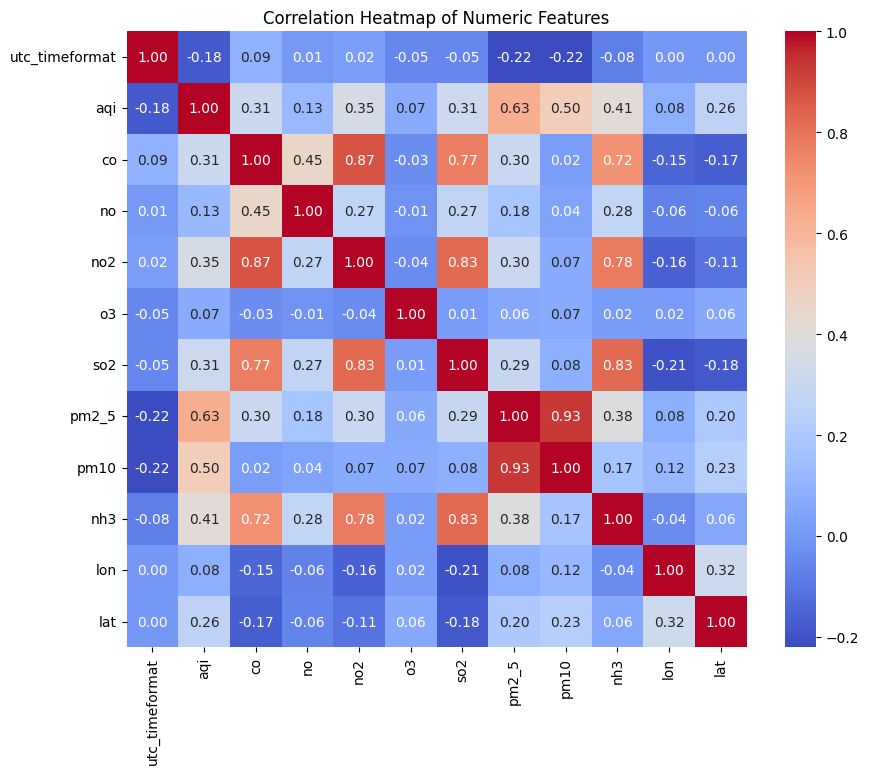

In [ ]:
correlation_matrix = final_df.corr(numeric_only=True)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap of Numeric Features")
plt.show()


In [ ]:
# air_pollution_api_final_new = final_df
# file_path = '/content/drive/MyDrive/air_pollution_api_final_new.csv'
# air_pollution_api_final_new.to_csv(file_path, index=False)
# print(f"file saved to: {file_path}")


file saved to: /content/drive/MyDrive/air_pollution_api_final_new.csv


# STAGE II

In [5]:
nigeria_air_pollution = pd.read_csv('/content/drive/MyDrive/air_pollution_api_final_new.csv')
nigeria_air_pollution.head()

,utc_timeformat,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,lon,lat,state_name,datetime_utc,aqi_desc
0,1672531200,5,1014.71,0.00,4.20,27.18,1.06,119.62,246.62,1.52,7.515307,5.454095,Abia,2023-01-01 00:00:00+00:00,Very Poor
1,1672534800,5,1001.36,0.00,4.16,18.95,0.72,120.51,245.57,1.22,7.515307,5.454095,Abia,2023-01-01 01:00:00+00:00,Very Poor
2,1672538400,5,1054.76,0.01,4.28,10.82,0.63,128.17,252.65,2.31,7.515307,5.454095,Abia,2023-01-01 02:00:00+00:00,Very Poor
3,1672542000,5,1108.17,0.02,4.37,7.60,0.79,138.33,264.60,3.36,7.515307,5.454095,Abia,2023-01-01 03:00:00+00:00,Very Poor
4,1672545600,5,1161.58,0.02,4.41,8.23,1.10,148.25,276.84,3.86,7.515307,5.454095,Abia,2023-01-01 04:00:00+00:00,Very Poor


In [6]:
# Drop utc time format column
nigeria_air_pollution = nigeria_air_pollution.drop(columns=['utc_timeformat'])

In [17]:
nigeria_air_pollution.dtypes

aqi                           int64
co                          float64
no                          float64
no2                         float64
o3                          float64
so2                         float64
pm2_5                       float64
pm10                        float64
nh3                         float64
lon                         float64
lat                         float64
state_name                   object
datetime_utc    datetime64[ns, UTC]
aqi_desc                     object
year                          int64
month                         int64
day                           int64
hour                          int64
dtype: object

In [8]:
# Convert 'datetime_utc' to datetime format
nigeria_air_pollution['datetime_utc'] = pd.to_datetime(nigeria_air_pollution['datetime_utc'], utc=True)

In [12]:
nigeria_air_pollution.head(10)

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,lon,lat,state_name,datetime_utc,aqi_desc,year,month,day,hour
0,5,1014.71,0.00,4.20,27.18,1.06,119.62,246.62,1.52,7.515307,5.454095,Abia,2023-01-01 00:00:00+00:00,Very Poor,2023,1,1,0
1,5,1001.36,0.00,4.16,18.95,0.72,120.51,245.57,1.22,7.515307,5.454095,Abia,2023-01-01 01:00:00+00:00,Very Poor,2023,1,1,1
2,5,1054.76,0.01,4.28,10.82,0.63,128.17,252.65,2.31,7.515307,5.454095,Abia,2023-01-01 02:00:00+00:00,Very Poor,2023,1,1,2
3,5,1108.17,0.02,4.37,7.60,0.79,138.33,264.60,3.36,7.515307,5.454095,Abia,2023-01-01 03:00:00+00:00,Very Poor,2023,1,1,3
4,5,1161.58,0.02,4.41,8.23,1.10,148.25,276.84,3.86,7.515307,5.454095,Abia,2023-01-01 04:00:00+00:00,Very Poor,2023,1,1,4
5,5,1201.63,0.02,4.58,9.12,1.40,155.03,282.62,4.43,7.515307,5.454095,Abia,2023-01-01 05:00:00+00:00,Very Poor,2023,1,1,5
6,5,1255.04,0.02,5.36,10.46,2.03,161.25,294.66,6.27,7.515307,5.454095,Abia,2023-01-01 06:00:00+00:00,Very Poor,2023,1,1,6
7,5,1068.12,0.13,4.24,20.38,2.18,149.76,313.95,6.46,7.515307,5.454095,Abia,2023-01-01 07:00:00+00:00,Very Poor,2023,1,1,7
8,5,907.90,0.29,2.63,32.19,2.00,142.77,322.11,5.76,7.515307,5.454095,Abia,2023-01-01 08:00:00+00:00,Very Poor,2023,1,1,8
9,5,700.95,0.20,1.37,45.78,1.71,129.38,327.87,4.88,7.515307,5.454095,Abia,2023-01-01 09:00:00+00:00,Very Poor,2023,1,1,9


In [11]:
# from sklearn.preprocessing import MinMaxScaler


nigeria_air_pollution['year'] = nigeria_air_pollution['datetime_utc'].dt.year
nigeria_air_pollution['month'] = nigeria_air_pollution['datetime_utc'].dt.month
nigeria_air_pollution['day'] = nigeria_air_pollution['datetime_utc'].dt.day
nigeria_air_pollution['hour'] = nigeria_air_pollution['datetime_utc'].dt.hour


In [14]:
nigeria_air_pollution.head()

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,lon,lat,state_name,datetime_utc,aqi_desc,year,month,day,hour
0,5,1014.71,0.00,4.20,27.18,1.06,119.62,246.62,1.52,7.515307,5.454095,Abia,2023-01-01 00:00:00+00:00,Very Poor,2023,1,1,0
1,5,1001.36,0.00,4.16,18.95,0.72,120.51,245.57,1.22,7.515307,5.454095,Abia,2023-01-01 01:00:00+00:00,Very Poor,2023,1,1,1
2,5,1054.76,0.01,4.28,10.82,0.63,128.17,252.65,2.31,7.515307,5.454095,Abia,2023-01-01 02:00:00+00:00,Very Poor,2023,1,1,2
3,5,1108.17,0.02,4.37,7.60,0.79,138.33,264.60,3.36,7.515307,5.454095,Abia,2023-01-01 03:00:00+00:00,Very Poor,2023,1,1,3
4,5,1161.58,0.02,4.41,8.23,1.10,148.25,276.84,3.86,7.515307,5.454095,Abia,2023-01-01 04:00:00+00:00,Very Poor,2023,1,1,4


In [18]:
print(nigeria_air_pollution['year'].unique())


[2023]


In [ ]:
correlation_matrix = nigeria_air_pollution.corr(numeric_only=True)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap of Numeric Features")
plt.show()

In [16]:
correlation_matrix

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,lon,lat,year,month,day,hour
aqi,1.000000,0.306142,0.125058,0.353381,0.067878,0.312925,0.628098,0.502630,0.411524,8.169368e-02,2.574684e-01,NaN,-0.179441,-0.048635,1.566791e-02
co,0.306142,1.000000,0.452330,0.871532,-0.032633,0.774262,0.302158,0.021103,0.715110,-1.468599e-01,-1.703486e-01,NaN,0.092522,0.015598,4.935188e-03
no,0.125058,0.452330,1.000000,0.267364,-0.014245,0.274763,0.176863,0.043708,0.277819,-6.419679e-02,-6.169963e-02,NaN,0.007446,-0.001333,-3.508992e-02
no2,0.353381,0.871532,0.267364,1.000000,-0.039274,0.826958,0.303363,0.069845,0.777827,-1.626856e-01,-1.075078e-01,NaN,0.021348,0.010071,4.474534e-02
o3,0.067878,-0.032633,-0.014245,-0.039274,1.000000,0.013307,0.063277,0.069700,0.017600,1.687423e-02,6.196011e-02,NaN,-0.049174,-0.020379,3.660017e-02
so2,0.312925,0.774262,0.274763,0.826958,0.013307,1.000000,0.292241,0.084533,0.826826,-2.058920e-01,-1.781615e-01,NaN,-0.051632,-0.000482,1.014043e-01
pm2_5,0.628098,0.302158,0.176863,0.303363,0.063277,0.292241,1.000000,0.930233,0.384112,8.005589e-02,1.958001e-01,NaN,-0.217487,-0.075810,-1.060387e-02
pm10,0.502630,0.021103,0.043708,0.069845,0.069700,0.084533,0.930233,1.000000,0.170782,1.224581e-01,2.290741e-01,NaN,-0.212480,-0.075455,-4.572902e-03
nh3,0.411524,0.715110,0.277819,0.777827,0.017600,0.826826,0.384112,0.170782,1.000000,-3.806937e-02,5.842635e-02,NaN,-0.077146,-0.002677,1.150511e-01
lon,0.081694,-0.146860,-0.064197,-0.162686,0.016874,-0.205892,0.080056,0.122458,-0.038069,1.000000e+00,3.195629e-01,NaN,0.000607,0.000842,-1.334101e-07


In [19]:

nigeria_air_pollution.describe()

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,lon,lat,year,month,day,hour
count,292093.000000,292093.000000,292093.000000,292093.000000,292093.000000,292093.000000,292093.000000,292093.000000,292093.000000,292093.000000,292093.000000,292093.0,292093.000000,292093.000000,292093.000000
mean,2.653384,653.027574,0.164210,3.208496,26.410654,1.208565,48.484261,138.574906,2.995259,7.382537,8.467391,2023.0,6.007573,15.613781,11.498543
std,1.460431,508.722191,1.302481,4.727061,115.009119,1.973030,86.705983,356.442713,4.791746,2.445850,2.491082,0.0,3.139330,8.718397,6.922970
min,1.000000,171.900000,0.000000,0.030000,-9999.000000,0.020000,0.500000,0.710000,0.000000,3.438929,4.762979,2023.0,1.000000,1.000000,0.000000
25%,1.000000,407.220000,0.000000,0.760000,11.620000,0.240000,8.620000,14.550000,0.820000,5.651109,6.526903,2023.0,3.000000,8.000000,5.000000
50%,2.000000,520.710000,0.020000,1.630000,21.990000,0.590000,19.060000,33.690000,1.690000,7.172467,8.014133,2023.0,6.000000,16.000000,11.000000
75%,4.000000,720.980000,0.080000,3.860000,37.910000,1.390000,51.000000,111.080000,3.230000,8.536414,10.383010,2023.0,9.000000,23.000000,17.000000
max,5.000000,20080.570000,146.630000,200.150000,346.180000,57.220000,2043.070000,11319.640000,162.120000,13.308003,13.061120,2023.0,11.000000,31.000000,23.000000


In [22]:
air_pollution_api_final_new_07122023 = nigeria_air_pollution
file_path = '/content/drive/MyDrive/air_pollution_api_final_new_07122023.csv'
air_pollution_api_final_new_07122023.to_csv(file_path, index=False)
print(f"file saved to: {file_path}")


file saved to: /content/drive/MyDrive/air_pollution_api_final_new_07122023.csv


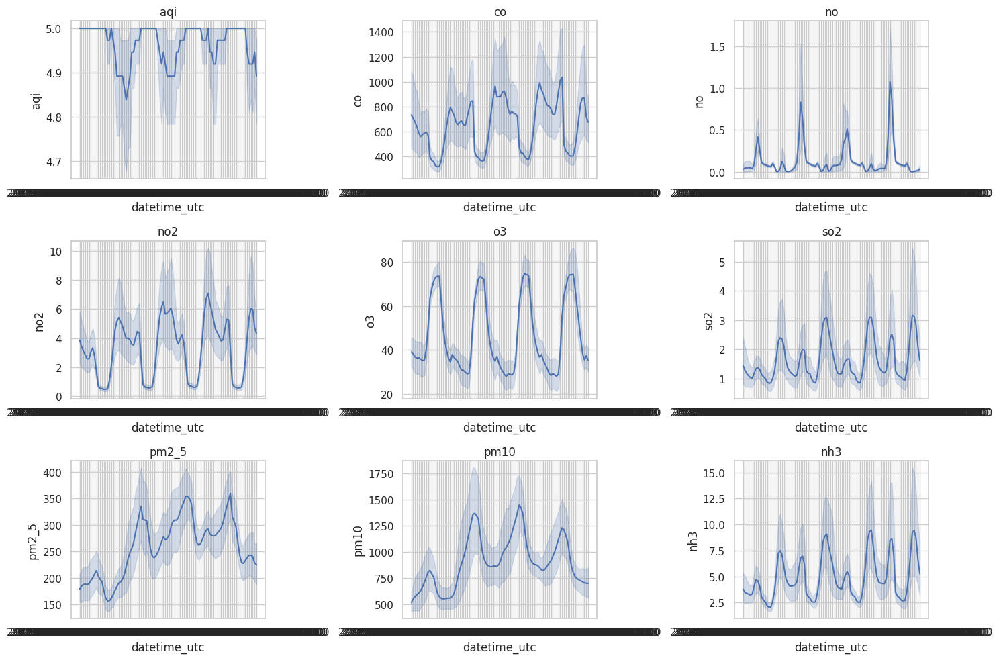

In [ ]:
# Limit time range
subset_df = nigeria_air_pollution[(nigeria_air_pollution['datetime_utc'] >= '2023-01-01') & (nigeria_air_pollution['datetime_utc'] <= '2023-01-05')]

# Plot time trends
sns.set(style="whitegrid")
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 10))

numerical_columns = ['aqi', 'co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3']


for col, ax in zip(numerical_columns, axes.flatten()):
    sns.lineplot(x='datetime_utc', y=col, data=subset_df, ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()


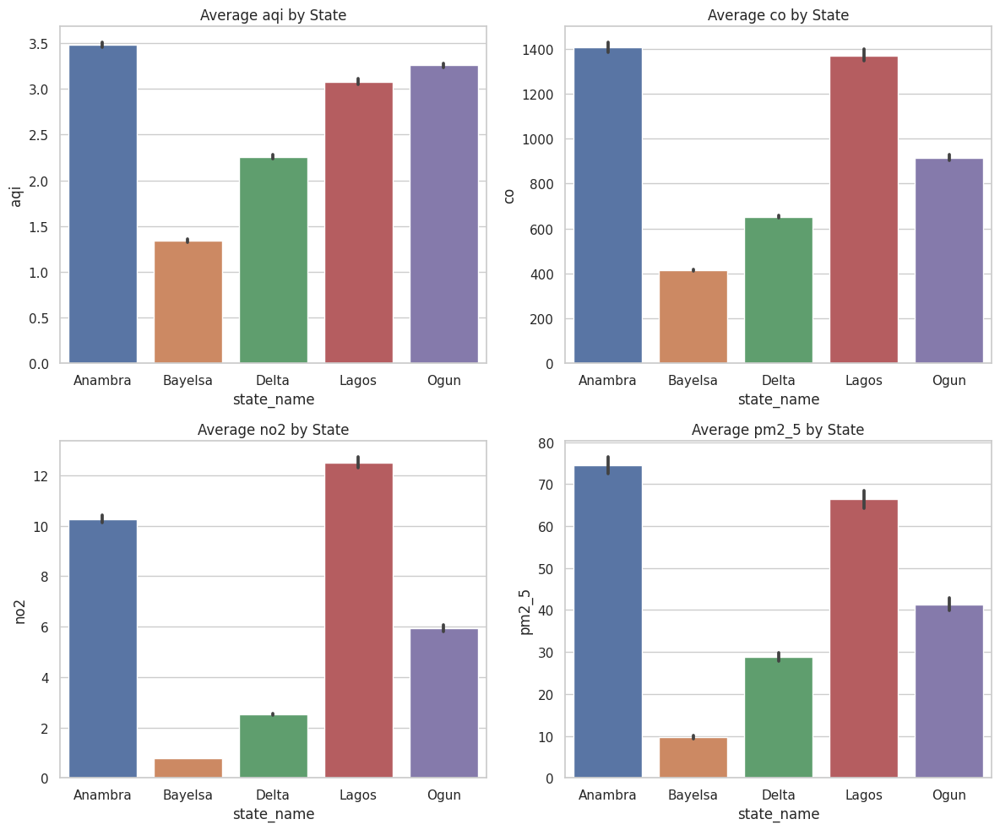

In [ ]:
selected_states = ['Lagos', 'Delta', 'Anambra', 'Bayelsa', 'Ogun']

# Filter for the selected states
filtered_data = nigeria_air_pollution[nigeria_air_pollution['state_name'].isin(selected_states)]

# Plot bar charts for average AQI, CO, NO2, PM2.5 by state
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

metrics_to_compare = ['aqi', 'co', 'no2', 'pm2_5']

for metric, ax in zip(metrics_to_compare, axes.flatten()):
    sns.barplot(x='state_name', y=metric, data=filtered_data, ax=ax)
    ax.set_title(f'Average {metric} by State')

# Adjust layout
plt.tight_layout()
plt.show()


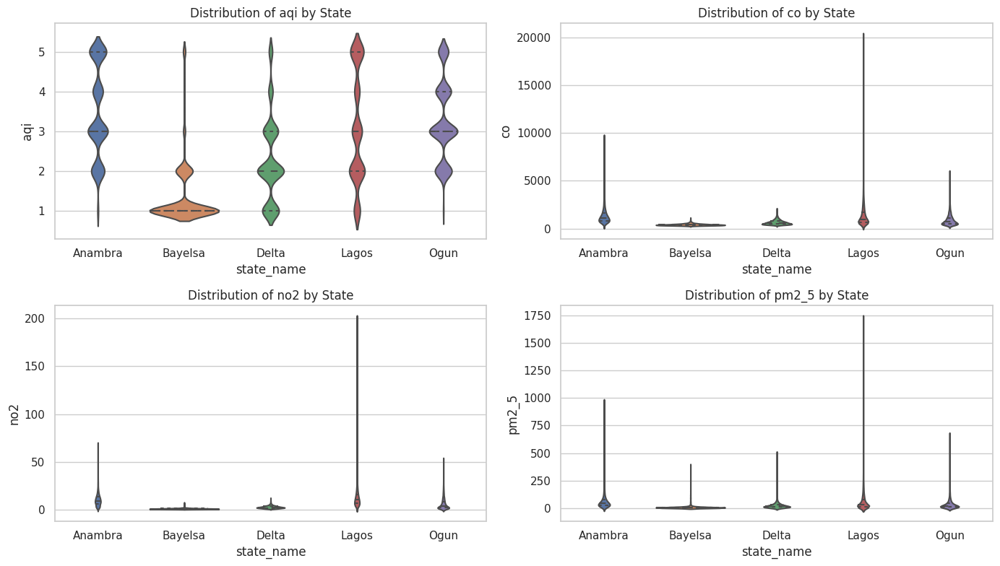

In [ ]:
selected_states = ['Lagos', 'Delta', 'Anambra', 'Bayelsa', 'Ogun']

# Filter the data for the selected states
filtered_data = nigeria_air_pollution[nigeria_air_pollution['state_name'].isin(selected_states)]

# Plot violin plots for AQI, CO, NO2, PM2.5 by state
metrics_to_compare = ['aqi', 'co', 'no2', 'pm2_5']
plt.figure(figsize=(14, 8))

for i, metric in enumerate(metrics_to_compare, 1):
    plt.subplot(2, 2, i)
    sns.violinplot(x='state_name', y=metric, data=filtered_data, inner='quartile')
    plt.title(f'Distribution of {metric} by State')

plt.tight_layout()
plt.show()


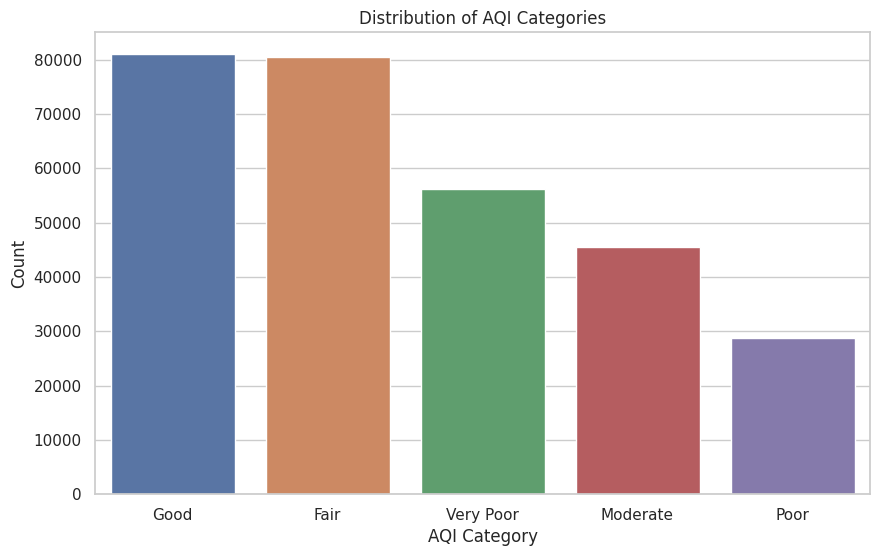

In [ ]:
# Plot a bar chart for the distribution of AQI categories
plt.figure(figsize=(10, 6))
sns.countplot(x='aqi_desc', data=nigeria_air_pollution, order=nigeria_air_pollution['aqi_desc'].value_counts().index)
plt.title('Distribution of AQI Categories')
plt.xlabel('AQI Category')
plt.ylabel('Count')
plt.show()


In [ ]:
# Test the significance correlation between AQI and PM2.5
corr_coef, p_value = pearsonr(nigeria_air_pollution['aqi'], nigeria_air_pollution['pm2_5'])
print(f"Correlation coefficient: {corr_coef}, p-value: {p_value}")


Correlation coefficient: 0.6280979654123282, p-value: 0.0


In [ ]:
# Test the significance correlation between AQI and PM2.5
corr_coef, p_value = pearsonr(nigeria_air_pollution['aqi'], nigeria_air_pollution['o3'])
print(f"Correlation coefficient: {corr_coef}, p-value: {p_value}")

Correlation coefficient: 0.06787809640369658, p-value: 2.673729553731588e-295


In [ ]:
numerical_columns = ['aqi', 'co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3']

In [ ]:
nigeria_air_pollution.dtypes

aqi               int64
co              float64
no              float64
no2             float64
o3              float64
so2             float64
pm2_5           float64
pm10            float64
nh3             float64
lon             float64
lat             float64
state_name       object
datetime_utc     object
aqi_desc         object
dtype: object

<ipython-input-43-c79cf2429641>:13: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='month', y='aqi', hue='state_name', data=nigeria_air_pollution, ci=None)


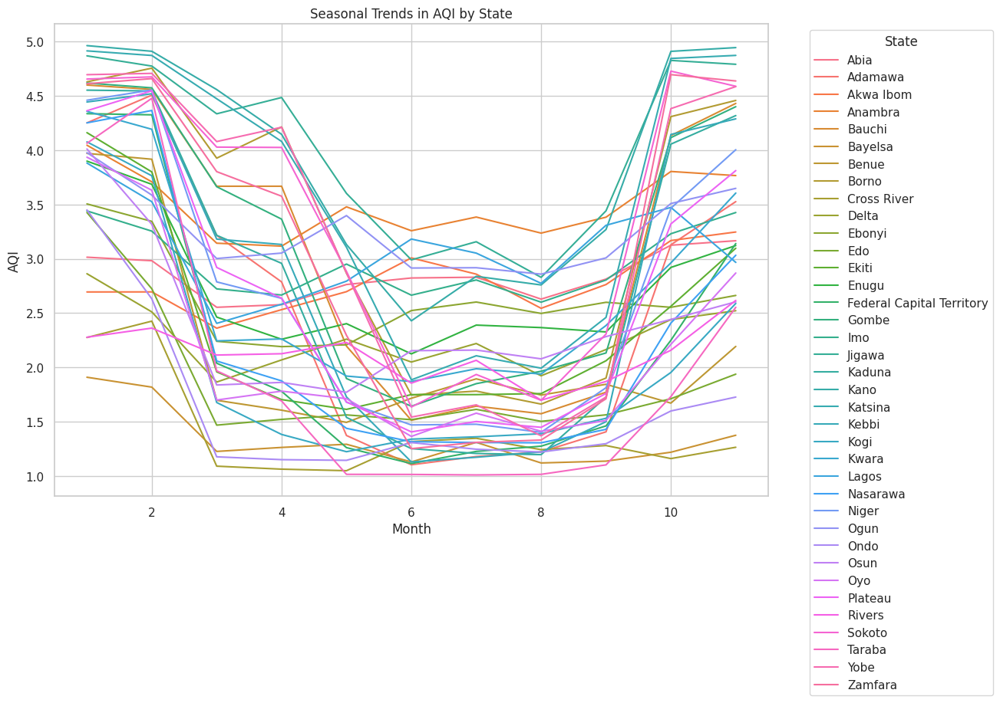

In [ ]:
# Extract month from datetime 
nigeria_air_pollution['month'] = nigeria_air_pollution['datetime_utc'].dt.month

# Plot seasonal trends using line plots
plt.figure(figsize=(12, 8))
sns.lineplot(x='month', y='aqi', hue='state_name', data=nigeria_air_pollution, ci=None)
plt.title('Seasonal Trends in AQI by State')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend(title='State', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()




In [ ]:
zip_ref = zipfile.ZipFile('/content/drive/MyDrive/ngaadmbndaadm2osgof.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

In [ ]:
# Geospatial Analysis using GeoPandas
# 'nigeria_states_shapefile.shp'
# Load shapefile
gdf_states = gpd.read_file('/content/nga_admbnda_adm2_osgof/nga_admbnda_adm2_osgof_20170222.shp')



In [ ]:
print(gdf_states.columns)
print(gdf_states.dtypes)


Index(['admin2Name', 'admin2Pcod', 'admin2RefN', 'admin2AltN', 'admin2Al_1',
       'state_name', 'admin1Pcod', 'admin0Name', 'admin0Pcod', 'date',
       'validOn', 'ValidTo', 'Shape_Leng', 'Shape_Area', 'geometry'],
      dtype='object')
admin2Name      object
admin2Pcod      object
admin2RefN      object
admin2AltN      object
admin2Al_1      object
state_name      object
admin1Pcod      object
admin0Name      object
admin0Pcod      object
date            object
validOn         object
ValidTo         object
Shape_Leng     float64
Shape_Area     float64
geometry      geometry
dtype: object


In [ ]:
gdf_states.rename(columns={'admin1Name': 'state_name'}, inplace=True)
print(gdf_states.columns)

Index(['admin2Name', 'admin2Pcod', 'admin2RefN', 'admin2AltN', 'admin2Al_1',
       'state_name', 'admin1Pcod', 'admin0Name', 'admin0Pcod', 'date',
       'validOn', 'ValidTo', 'Shape_Leng', 'Shape_Area', 'geometry'],
      dtype='object')


In [ ]:
print(nigeria_air_pollution.columns)
print(nigeria_air_pollution.dtypes)


Index(['aqi', 'co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3', 'lon',
       'lat', 'state_name', 'datetime_utc', 'aqi_desc'],
      dtype='object')
aqi                           int64
co                          float64
no                          float64
no2                         float64
o3                          float64
so2                         float64
pm2_5                       float64
pm10                        float64
nh3                         float64
lon                         float64
lat                         float64
state_name                   object
datetime_utc    datetime64[ns, UTC]
aqi_desc                     object
dtype: object


In [ ]:
print("Unique values in nigeria_air_pollution['state_name']:", nigeria_air_pollution['state_name'].unique())
print("Unique values in gdf_states['state_name']:", gdf_states['state_name'].unique())


Unique values in nigeria_air_pollution['state_name']: ['Abia' 'Adamawa' 'Akwa Ibom' 'Anambra' 'Bauchi' 'Bayelsa' 'Benue' 'Borno'
 'Cross River' 'Delta' 'Ebonyi' 'Edo' 'Ekiti' 'Enugu'
 'Federal Capital Territory' 'Gombe' 'Imo' 'Jigawa' 'Kaduna' 'Kano'
 'Katsina' 'Kebbi' 'Kogi' 'Kwara' 'Lagos' 'Nasarawa' 'Niger' 'Ogun' 'Ondo'
 'Osun' 'Oyo' 'Plateau' 'Rivers' 'Sokoto' 'Taraba' 'Yobe' 'Zamfara']
Unique values in gdf_states['state_name']: ['Abia' 'Federal Capital Territory' 'Akwa Ibom' 'Ebonyi' 'Ogun'
 'Cross River' 'Imo' 'Rivers' 'Kogi' 'Benue' 'Ekiti' 'Oyo' 'Niger' 'Lagos'
 'Anambra' 'Osun' 'Kano' 'Gombe' 'Edo' 'Ondo' 'Nasarawa' 'Kebbi' 'Bauchi'
 'Enugu' 'Delta' 'Zamfara' 'Taraba' 'Kwara' 'Jigawa' 'Yobe' 'Katsina'
 'Plateau' 'Sokoto' 'Kaduna' 'Bayelsa' 'Adamawa' 'Borno']


In [ ]:
# Merge
gdf_merged = gdf_states.merge(nigeria_air_pollution.groupby('state_name')['aqi'].mean().reset_index(), on='state_name')

<Figure size 1000x1000 with 0 Axes>

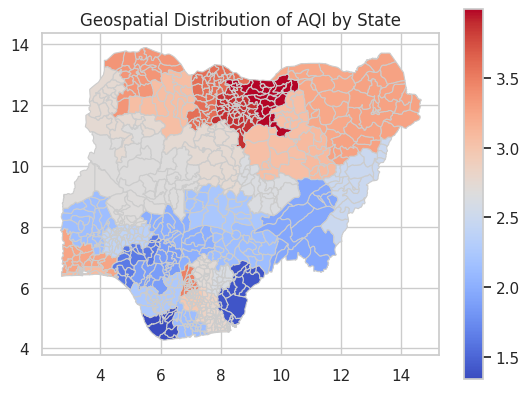

In [ ]:
# geospatial distribution of AQI
plt.figure(figsize=(10, 10))
gdf_merged.plot(column='aqi', cmap='coolwarm', linewidth=0.8, edgecolor='0.8', legend=True)
plt.title('Geospatial Distribution of AQI by State')
plt.show()

In [ ]:
# plotly
fig = px.choropleth_mapbox(
    gdf_merged,
    geojson=gdf_merged.geometry,
    locations=gdf_merged.index,
    color='aqi',
    color_continuous_scale="Viridis",
    mapbox_style="carto-positron",
    zoom=4,
    center={"lat": 9.0820, "lon": 8.6753},  # Nigeria co-ord
    opacity=0.5,
    labels={'aqi': 'AQI'},
    hover_name='state_name',  
    hover_data={'aqi': True, 'state_name': False},  
)

fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# # Remove leading and trailing whitespaces
# nigeria_air_pollution['state_name'] = nigeria_air_pollution['state_name'].str.strip()
# gdf_states['state_name'] = gdf_states['admin1Name'].str.strip()

# # 
# gdf_merged = gdf_states.merge(nigeria_air_pollution.groupby('state_name')['aqi'].mean().reset_index(), on='state_name')


### Linear Regression

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics as mt
from sklearn.metrics import mean_squared_error

In [ ]:
# features (X) and target variable (y)
X = nigeria_air_pollution[['co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3']]
y = nigeria_air_pollution['aqi']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Linear Regression
model = LinearRegression()
model.fit(X_train, y_train)

print(f'Intercept : {model.intercept_}')

y_pred = model.predict(X_test)


# metics
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')


Intercept : 2.3255722245209407
Mean Squared Error: 1.1044898344713165


In [ ]:
coeffients = pd.DataFrame(model.coef_,X.columns,columns=['Coefficient'])
coeffients

,Coefficient
co,-0.001011
no,-0.012632
no2,0.079134
o3,0.000477
so2,-0.047315
pm2_5,0.023117
pm10,-0.003306
nh3,0.038749


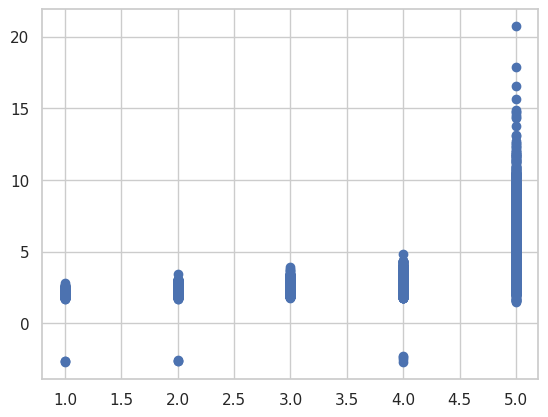

In [ ]:
plt.scatter(y_test,y_pred)

In [ ]:
print('Mean Absolute Error (MAE):', mt.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error (MSE):', mt.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error (RMSE):', np.sqrt(mt.mean_squared_error(y_test, y_pred)))
print('R Squared:', mt.r2_score(y_test, y_pred))

Mean Absolute Error (MAE): 0.8447432034063774
Mean Squared Error (MSE): 1.1044898344713165
Root Mean Squared Error (RMSE): 1.0509471130705468
R Squared: 0.4819528279429446


In [ ]:
# new prediction
new_data = pd.DataFrame([[46, 0.1, 0.05, 35, 120.1, 250,150,3.3]], columns=['co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3'])
new_pred = model.predict(new_data)
#print(f"Predicted AQI Value: {round(new_pred[0])}")
print(f"Predicted AQI Value: {new_pred[0]}")

Predicted AQI Value: 2.026993537050831


In [ ]:
#features (X) and target variable (y)
X = nigeria_air_pollution[['co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3','lon','lat']]
y = nigeria_air_pollution['aqi']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Linear Regression
model = LinearRegression()
model.fit(X_train, y_train)

print(f'Intercept : {model.intercept_}')

y_pred = model.predict(X_test)


# Metrics
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')


Intercept : 1.4355864525023772
Mean Squared Error: 1.0662415578342432


In [ ]:
coeffients = pd.DataFrame(model.coef_,X.columns,columns=['Coefficient'])
coeffients

,Coefficient
co,-0.000874
no,-0.013170
no2,0.073572
o3,0.000385
so2,0.027884
pm2_5,0.022436
pm10,-0.003267
nh3,0.009063
lon,0.015947
lat,0.086110


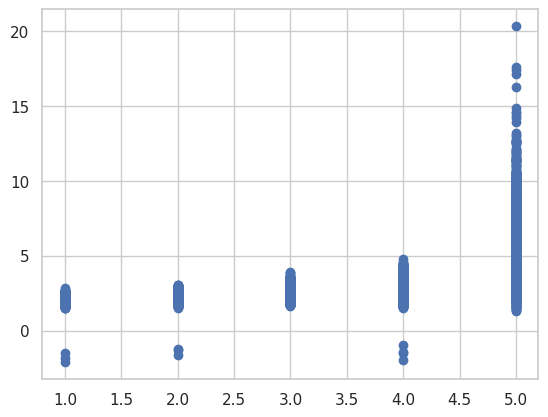

In [ ]:
plt.scatter(y_test,y_pred)

In [ ]:
print('Mean Absolute Error (MAE):', mt.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error (MSE):', mt.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error (RMSE):', np.sqrt(mt.mean_squared_error(y_test, y_pred)))
print('R Squared:', mt.r2_score(y_test, y_pred))

Mean Absolute Error (MAE): 0.826700033627275
Mean Squared Error (MSE): 1.0662415578342432
Root Mean Squared Error (RMSE): 1.0325897335506697
R Squared: 0.49989270473445546


In [ ]:
# new prediction
new_data = pd.DataFrame([[46, 0.1, 0.05, 35, 120.1, 250,150,3.3,7.515307,5.454095]], columns=['co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3','lon','lat'])
new_pred = model.predict(new_data)
#print(f"Predicted AQI Value: {round(new_pred[0])}")
print(f"Predicted AQI Value: {new_pred[0]}")

Predicted AQI Value: 10.498566873621435


In [ ]:
#Scaled
from sklearn.preprocessing import MinMaxScaler

# features (X) and target variable (y)
X = nigeria_air_pollution[['co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3']]
y = nigeria_air_pollution['aqi']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = MinMaxScaler()
X_train_normalized = scaler.fit_transform(X_train)
X_test_normalized = scaler.transform(X_test)

# Linear Regression
model = LinearRegression()
model.fit(X_train_normalized, y_train)

print(f'Intercept : {model.intercept_}')

y_pred = model.predict(X_test_normalized)

# metricd
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')


Intercept : -2.60208192462619
Mean Squared Error: 1.1044898344713165


In [ ]:
# new prediction
new_data = pd.DataFrame([[46, 0.1, 0.05, 35, 120.1, 250,150,3.3]], columns=['co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3'])
new_data_normalized = scaler.transform(new_data)
new_pred = model.predict(new_data_normalized)
#print(f"Predicted AQI Value: {round(new_pred[0])}")
print(f"Predicted AQI Value: {new_pred[0]}")

Predicted AQI Value: 2.0269935370508536


In [ ]:
# Assuming y_test is a pandas Series
results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print(results.head())


        Actual  Predicted
265494       2   2.828047
277586       5   4.557180
209358       1   2.298227
171623       1   2.263115
17828        2   1.944258


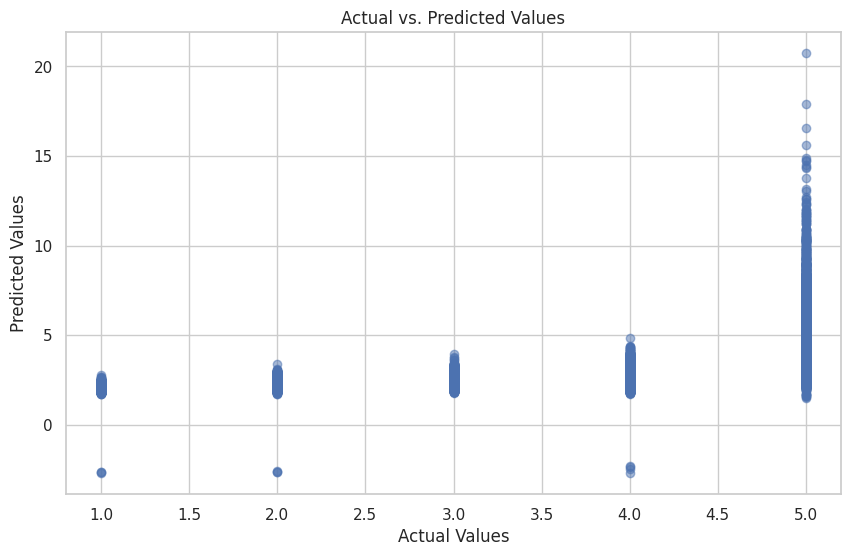

In [ ]:
plt.figure(figsize=(10, 6))

# Scatter
plt.scatter(results['Actual'], results['Predicted'], alpha=0.5)
plt.title('Actual vs. Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()


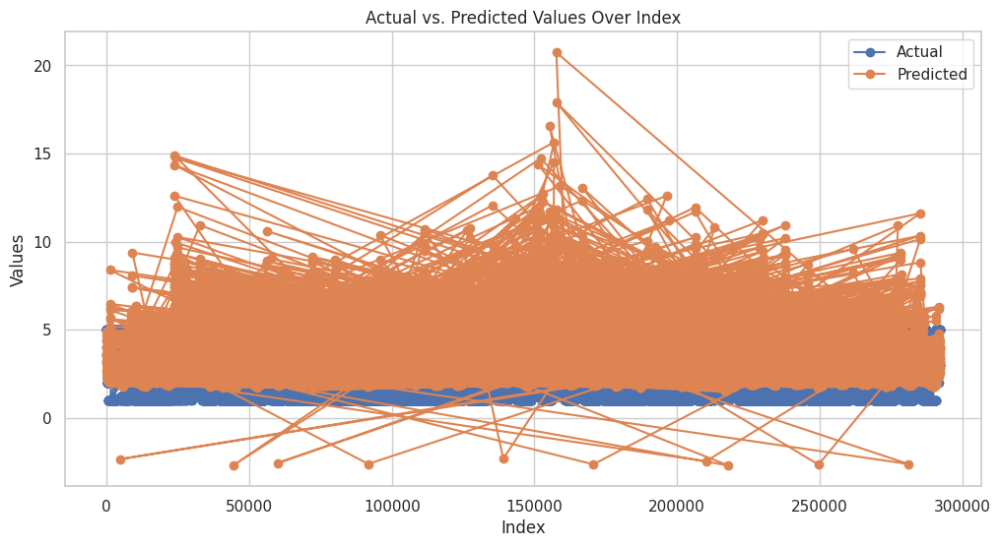

In [ ]:
plt.figure(figsize=(12, 6))

# Line plot for actual values
plt.plot(results.index, results['Actual'], label='Actual', marker='o')

# Line plot for predicted values
plt.plot(results.index, results['Predicted'], label='Predicted', marker='o')

plt.title('Actual vs. Predicted Values Over Index')
plt.xlabel('Index')
plt.ylabel('Values')
plt.legend()
plt.show()
